wGAN using **Wasserstein distance** for loss evaluation.  
Take the **GP(Gradient Penalty)** method so that the discriminator does not learn too fast.\

In [1]:
import cv2
import matplotlib.pyplot as plt
from imutils import paths
import tensorflow as tf
import numpy as np
from tensorflow import keras
from tensorflow.keras.layers import *
from tensorflow.keras.initializers import RandomNormal
from tensorflow.keras import Model

2023-06-22 21:24:32.301328: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-06-22 21:24:32.918431: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT


In [2]:
def ceildiv(a, b):
    return -(-a // b)

def plots_from_files(imspaths, figsize=(6,8), rows=1, maintitle=None):
    f = plt.figure(figsize=figsize)
    if maintitle is not None: plt.suptitle(maintitle, fontsize=10)
    for i in range(len(imspaths)):
        sp = f.add_subplot(rows, ceildiv(len(imspaths), rows), i+1)
        sp.axis('Off')
        img = cv2.imread(imspaths[i])
        img = cv2.cvtColor(img, cv2.COLOR_RGB2BGR)
        plt.imshow(img)
    f.tight_layout()

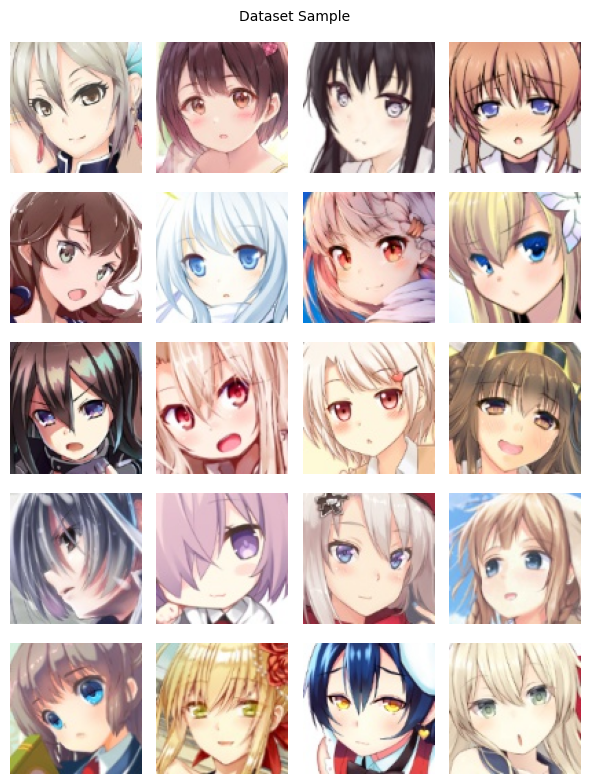

In [3]:
plots_from_files(imspaths = list(paths.list_images('./faces'))[0:20], rows = 5, maintitle = 'Dataset Sample')

In [4]:
images = paths.list_images('./faces')

dataset = []
for imgpath in images:
    img = cv2.imread(imgpath)
    img = cv2.resize(img, (64, 64))
    dataset.append(img/255.0)

In [5]:
# np.array(dataset).shape

In [6]:
BS = 128

dataset = tf.data.Dataset.from_tensor_slices(np.array(dataset))
dataset = dataset.shuffle(buffer_size=1024).batch(BS)

2023-06-22 21:24:58.569990: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1635] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 38370 MB memory:  -> device: 0, name: NVIDIA A100-SXM4-40GB, pci bus id: 0000:07:00.0, compute capability: 8.0
2023-06-22 21:24:58.573061: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1635] Created device /job:localhost/replica:0/task:0/device:GPU:1 with 38370 MB memory:  -> device: 1, name: NVIDIA A100-SXM4-40GB, pci bus id: 0000:0f:00.0, compute capability: 8.0
2023-06-22 21:24:58.575777: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1635] Created device /job:localhost/replica:0/task:0/device:GPU:2 with 38370 MB memory:  -> device: 2, name: NVIDIA A100-SXM4-40GB, pci bus id: 0000:47:00.0, compute capability: 8.0
2023-06-22 21:24:58.578439: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1635] Created device /job:localhost/replica:0/task:0/device:GPU:3 with 38370 MB memory:  -> device: 3, name: NVIDIA A100-SXM4-40GB, pci bu

In [7]:
tf.keras.backend.clear_session()

In [8]:
Noise_Dim = 150

def build_generator(input_shape=Noise_Dim):

    input_layer = Input(input_shape)
    
    x = Dense(4*4*512, use_bias=False)(input_layer)
    x = Reshape((4, 4, 512))(x)
    
    x = Conv2DTranspose(512, (4, 4), strides=(1, 1), padding='same', use_bias=False, kernel_initializer=RandomNormal(mean=0.0, stddev=0.02))(x)
    x = BatchNormalization()(x)
    x = LeakyReLU()(x)
    
    x = Conv2DTranspose(256, (4, 4), strides=(2, 2), padding='same', use_bias=False, kernel_initializer=RandomNormal(mean=0.0, stddev=0.02))(x)
    x = BatchNormalization()(x)
    x = LeakyReLU()(x)
    
    x = Conv2DTranspose(128, (4, 4), strides=(2, 2), padding='same', use_bias=False, kernel_initializer=RandomNormal(mean=0.0, stddev=0.02))(x)
    x = BatchNormalization()(x)
    x = LeakyReLU()(x)
    
    x = Conv2DTranspose(64, (4, 4), strides=(2, 2), padding='same', use_bias=False, kernel_initializer=RandomNormal(mean=0.0, stddev=0.02))(x)
    x = BatchNormalization()(x)
    x = LeakyReLU()(x)
    
    output = Conv2DTranspose(3, (4, 4), strides=(2, 2), padding='same', use_bias=False, activation="tanh",
                             kernel_initializer=RandomNormal(mean=0.0, stddev=0.02))(x)
    
    model = Model(inputs=input_layer, outputs=output)
    return model

generator = build_generator()
generator.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 150)]             0         
                                                                 
 dense (Dense)               (None, 8192)              1228800   
                                                                 
 reshape (Reshape)           (None, 4, 4, 512)         0         
                                                                 
 conv2d_transpose (Conv2DTra  (None, 4, 4, 512)        4194304   
 nspose)                                                         
                                                                 
 batch_normalization (BatchN  (None, 4, 4, 512)        2048      
 ormalization)                                                   
                                                                 
 leaky_re_lu (LeakyReLU)     (None, 4, 4, 512)         0     

In [9]:
def build_discriminator(input_shape=(64, 64, 3)):

    input_layer = Input(input_shape)
    
    x = Conv2D(64, (4, 4), strides=(2, 2), padding='same', use_bias=False, kernel_initializer=RandomNormal(mean=0.0, stddev=0.02))(input_layer)
    x = LeakyReLU()(x)
    
    x = Conv2D(128, (4, 4), strides=(2, 2), padding='same', use_bias=False, kernel_initializer=RandomNormal(mean=0.0, stddev=0.02))(x)
    x = LeakyReLU()(x)
    
    x = Conv2D(256, (4, 4), strides=(2, 2), padding='same', use_bias=False, kernel_initializer=RandomNormal(mean=0.0, stddev=0.02))(x)
    x = LeakyReLU()(x)
    
    x = Conv2D(512, (4, 4), strides=(2, 2), padding='same', use_bias=False, kernel_initializer=RandomNormal(mean=0.0, stddev=0.02))(x)
    x = LeakyReLU()(x)
    
    x = Conv2D(1, (4, 4), strides=(1, 1), padding='same', use_bias=False, kernel_initializer=RandomNormal(mean=0.0, stddev=0.02))(x)
    
    x = Flatten()(x)

    output = Dense(1)(x)
    
    model = Model(inputs=input_layer, outputs=output)
    return model

discriminator = build_discriminator()
discriminator.summary()

Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 64, 64, 3)]       0         
                                                                 
 conv2d (Conv2D)             (None, 32, 32, 64)        3072      
                                                                 
 leaky_re_lu_4 (LeakyReLU)   (None, 32, 32, 64)        0         
                                                                 
 conv2d_1 (Conv2D)           (None, 16, 16, 128)       131072    
                                                                 
 leaky_re_lu_5 (LeakyReLU)   (None, 16, 16, 128)       0         
                                                                 
 conv2d_2 (Conv2D)           (None, 8, 8, 256)         524288    
                                                                 
 leaky_re_lu_6 (LeakyReLU)   (None, 8, 8, 256)         0   

In [10]:
from tensorflow.keras import backend as K

LR = 1e-4
min_LR = 1e-7
decay_rate = 1.00004

optG = keras.optimizers.Adam(learning_rate=LR, beta_1=0.5)
optD = keras.optimizers.Adam(learning_rate=LR, beta_1=0.5)

def lr_decay(current_lr, decay_rate=decay_rate):
    new_lr = max(current_lr / decay_rate, min_LR)
    K.set_value(optG.lr, new_lr)
    K.set_value(optD.lr, new_lr) 
    return new_lr

### wGAN Loss
##### discriminator loss
discriminator計算(真圖片=真)和(生成圖片=真)的分數，兩者之差就是w distance，為了區分真實圖片(r)和生成圖片(g)，要
maximize這個距離，得 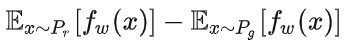
因為要maximize，所以取負號再做gradient descent  
結論: **tf.reduce_mean(fake) - tf.reduce_mean(real)**
##### geneator loss
generator要讓(生成圖片=真)的分數越高越好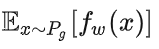
因為要maximize，所以取負號再做gradient descent  
結論: **- tf.reduce_mean(real)**

### Gradient Penalty
因上述discriminator需要滿足1-Lipschitz，約束gradient update，限制discriminator的能力，不要讓discriminator變太強
##### clip
原本的作法是把weight clip在一定的範圍內。
但可能最後會出現weight都趨近於bound的情況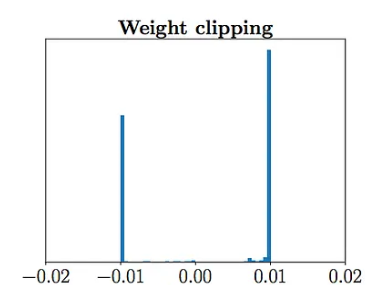
所以出現gradient penalty的作法
##### gradient penatly
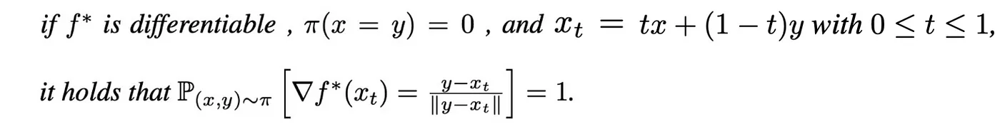
把(真、生成圖片混和)對(生成圖片)取gradient的norm要越接近1，越可以符合1-Lipschitz
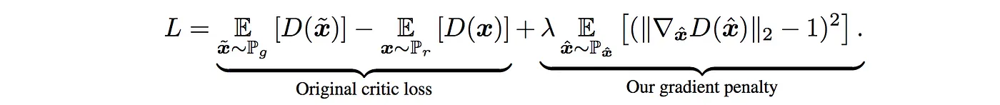
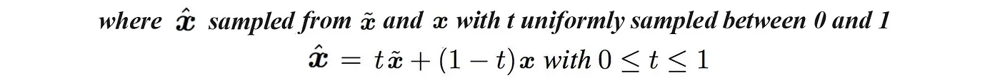



In [11]:
## train disciminator to classify original img and gerenated img
LAMBDA = 10

@tf.function
def trainDStep(data):
    
    with tf.GradientTape() as tape:
        
        real  = tf.cast(data, tf.float32)
        Noise = tf.random.normal(shape=(real.get_shape()[0], Noise_Dim))
        fake  = generator(Noise)
        t     = tf.random.uniform(shape=[real.get_shape()[0], 1, 1, 1], minval=0, maxval=1)
        interpolation = t * tf.cast(real, tf.float32) + (1.0 - t) * fake
        
        # calculate gp
        with tf.GradientTape() as gptape:    
            gptape.watch(interpolation)
            interpolation_pred = discriminator(interpolation)
        grads = gptape.gradient(interpolation_pred, interpolation)
        grad_norms = tf.sqrt(tf.reduce_sum(tf.square(grads), axis=[1, 2, 3]))
        gradient_penalty = LAMBDA * tf.reduce_mean(tf.square(grad_norms - 1))
        
        fake_pred = discriminator(fake)
        real_pred = discriminator(real)
        discriminatorLoss = tf.reduce_mean(fake_pred) - tf.reduce_mean(real_pred) + gradient_penalty
        
    discriminator_grad = tape.gradient(discriminatorLoss, discriminator.trainable_variables)
    optD.apply_gradients(zip(discriminator_grad, discriminator.trainable_variables))
    
    return{
        'discriminator_loss' : discriminatorLoss
    }

In [12]:
## train generator make fake img
@tf.function
def trainGStep(data):
    BS = data.get_shape()[0]
    Noise = tf.random.normal(shape=(BS, Noise_Dim))
 
    with tf.GradientTape() as tape:
        fake_pred = discriminator(generator(Noise))
        generatorLoss = -tf.reduce_mean(fake_pred)
    grad = tape.gradient(generatorLoss, generator.trainable_variables)
    optG.apply_gradients(zip(grad, generator.trainable_variables))
    
    return{
        'generator_loss' : generatorLoss
    }

In [13]:
sample_noise = tf.random.normal([5*5, Noise_Dim])

def plot_result(model, is_sample=1):
    if is_sample == 1:
        images = model(sample_noise)
    else:
        images = model(np.random.normal(size=(5*5, Noise_Dim)))
    
    plt.figure(figsize=(5,5))
    for i, image in enumerate(images):
        image = image.numpy()
        
        # min-max normalization
        min_vals = np.min(image, axis=(0,1,2))
        max_vals = np.max(image, axis=(0,1,2))
        image = (image - min_vals) / (max_vals - min_vals)
        
        plt.subplot(5, 5, i+1)
        image = cv2.cvtColor(image, cv2.COLOR_RGB2BGR)
        plt.imshow(image)
        plt.axis('off')
        
    plt.tight_layout()
    plt.show()

2023-06-22 21:25:06.022710: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype double and shape [71314,64,64,3]
	 [[{{node Placeholder/_0}}]]
2023-06-22 21:25:06.023015: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype double and shape [71314,64,64,3]
	 [[{{node Placeholder/_0}}]]
2023-06-22 21:25:07.902677: I tensorflow/compiler/xla/stream_executor/cuda/cuda_blas.cc:637] TensorFloat-32 will be used for the matrix multiplication. This will only be logged once.
2023-06-22 21:25:08.056181: I tensorflow/compiler/xla/stream_executor/cuda/cuda_dnn.cc:424] Loaded cuDNN versio

epoch:0        DiscriminatorLoss:-24.95        GeneratorLoss:4.45


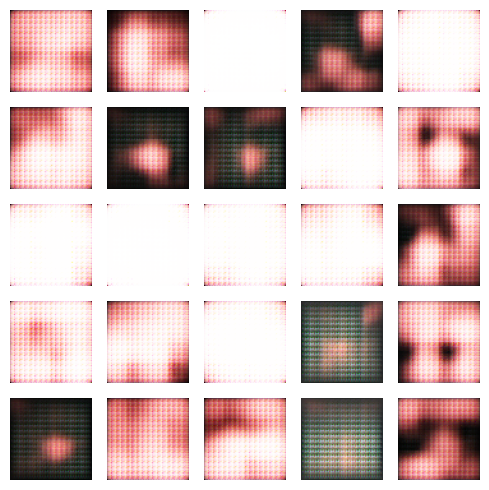

epoch:1        DiscriminatorLoss:-11.12        GeneratorLoss:1.94
epoch:2        DiscriminatorLoss:-8.49        GeneratorLoss:1.09
epoch:3        DiscriminatorLoss:-8.26        GeneratorLoss:-0.44
epoch:4        DiscriminatorLoss:-7.98        GeneratorLoss:-0.35
epoch:5        DiscriminatorLoss:-7.46        GeneratorLoss:0.14
epoch:6        DiscriminatorLoss:-6.88        GeneratorLoss:0.06
epoch:7        DiscriminatorLoss:-6.74        GeneratorLoss:-0.29
epoch:8        DiscriminatorLoss:-6.53        GeneratorLoss:-0.48
epoch:9        DiscriminatorLoss:-6.31        GeneratorLoss:-0.80
epoch:10        DiscriminatorLoss:-6.15        GeneratorLoss:-1.18


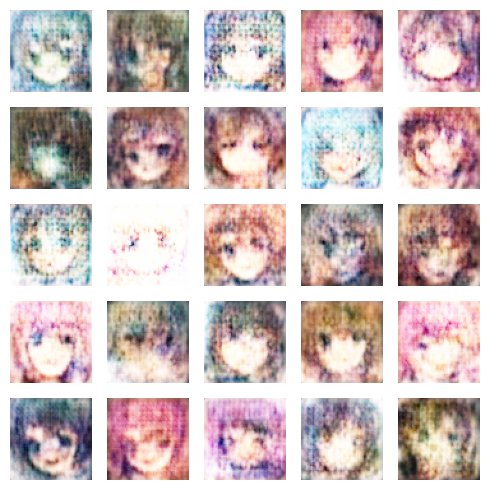

epoch:11        DiscriminatorLoss:-5.90        GeneratorLoss:-1.70
epoch:12        DiscriminatorLoss:-5.63        GeneratorLoss:-1.79
epoch:13        DiscriminatorLoss:-5.46        GeneratorLoss:-1.31
epoch:14        DiscriminatorLoss:-5.25        GeneratorLoss:-1.25
epoch:15        DiscriminatorLoss:-5.07        GeneratorLoss:-0.47
epoch:16        DiscriminatorLoss:-4.86        GeneratorLoss:-0.07
epoch:17        DiscriminatorLoss:-4.75        GeneratorLoss:0.01
epoch:18        DiscriminatorLoss:-4.65        GeneratorLoss:0.04
epoch:19        DiscriminatorLoss:-4.56        GeneratorLoss:0.28
epoch:20        DiscriminatorLoss:-4.47        GeneratorLoss:0.31


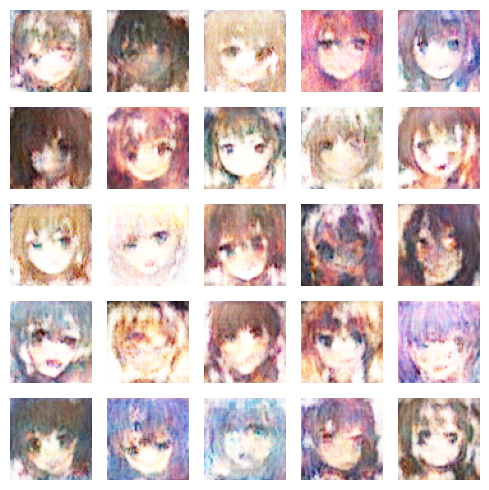

epoch:21        DiscriminatorLoss:-4.36        GeneratorLoss:0.71
epoch:22        DiscriminatorLoss:-4.30        GeneratorLoss:0.75
epoch:23        DiscriminatorLoss:-4.23        GeneratorLoss:0.73
epoch:24        DiscriminatorLoss:-4.14        GeneratorLoss:0.77
epoch:25        DiscriminatorLoss:-4.05        GeneratorLoss:0.97
epoch:26        DiscriminatorLoss:-3.96        GeneratorLoss:1.07
epoch:30        DiscriminatorLoss:-3.65        GeneratorLoss:1.31


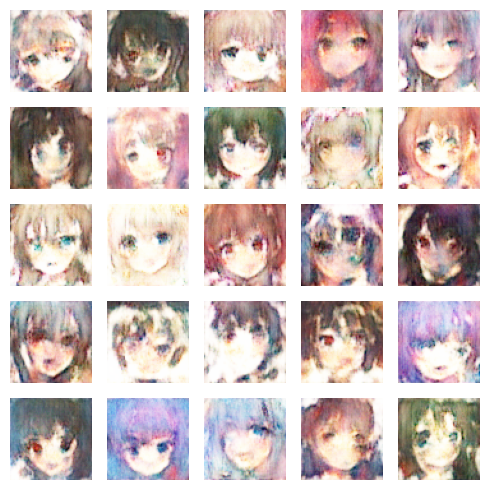

epoch:31        DiscriminatorLoss:-3.58        GeneratorLoss:1.28
epoch:32        DiscriminatorLoss:-3.53        GeneratorLoss:1.19
epoch:33        DiscriminatorLoss:-3.48        GeneratorLoss:1.16
epoch:34        DiscriminatorLoss:-3.42        GeneratorLoss:1.23
epoch:35        DiscriminatorLoss:-3.35        GeneratorLoss:1.16
epoch:36        DiscriminatorLoss:-3.27        GeneratorLoss:1.13
epoch:37        DiscriminatorLoss:-3.21        GeneratorLoss:1.23
epoch:38        DiscriminatorLoss:-3.16        GeneratorLoss:1.06
epoch:39        DiscriminatorLoss:-3.11        GeneratorLoss:1.05
epoch:40        DiscriminatorLoss:-3.05        GeneratorLoss:1.13


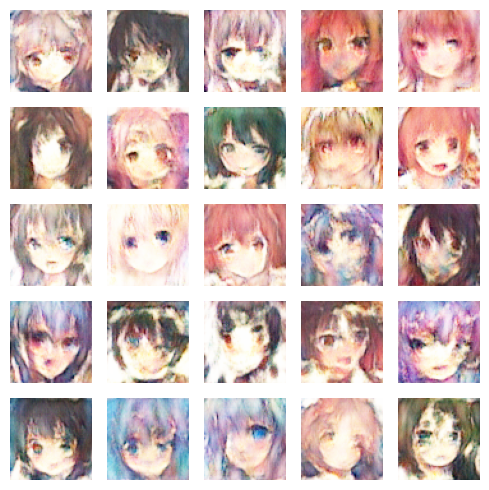

epoch:41        DiscriminatorLoss:-3.02        GeneratorLoss:1.16
epoch:42        DiscriminatorLoss:-2.96        GeneratorLoss:1.05
epoch:43        DiscriminatorLoss:-2.92        GeneratorLoss:1.04
epoch:44        DiscriminatorLoss:-2.88        GeneratorLoss:1.12
epoch:45        DiscriminatorLoss:-2.84        GeneratorLoss:1.09
epoch:46        DiscriminatorLoss:-2.80        GeneratorLoss:1.17
epoch:47        DiscriminatorLoss:-2.79        GeneratorLoss:1.09
epoch:48        DiscriminatorLoss:-2.74        GeneratorLoss:1.11
epoch:49        DiscriminatorLoss:-2.72        GeneratorLoss:1.21
epoch:50        DiscriminatorLoss:-2.70        GeneratorLoss:1.05


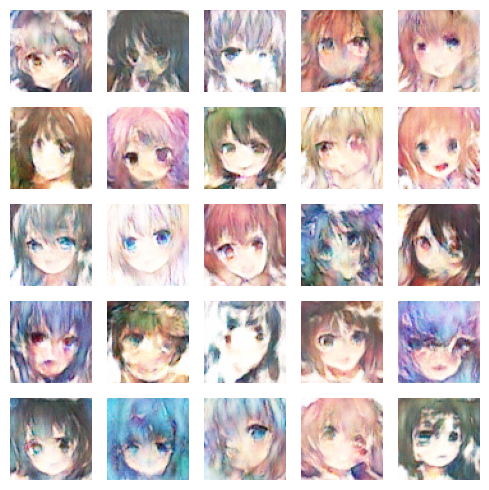

epoch:51        DiscriminatorLoss:-2.67        GeneratorLoss:1.04
epoch:52        DiscriminatorLoss:-2.65        GeneratorLoss:1.12
epoch:53        DiscriminatorLoss:-2.62        GeneratorLoss:0.88
epoch:54        DiscriminatorLoss:-2.59        GeneratorLoss:1.05
epoch:55        DiscriminatorLoss:-2.58        GeneratorLoss:0.92
epoch:56        DiscriminatorLoss:-2.56        GeneratorLoss:0.95
epoch:57        DiscriminatorLoss:-2.53        GeneratorLoss:0.95
epoch:58        DiscriminatorLoss:-2.52        GeneratorLoss:0.83
epoch:59        DiscriminatorLoss:-2.49        GeneratorLoss:0.89
epoch:60        DiscriminatorLoss:-2.49        GeneratorLoss:0.77


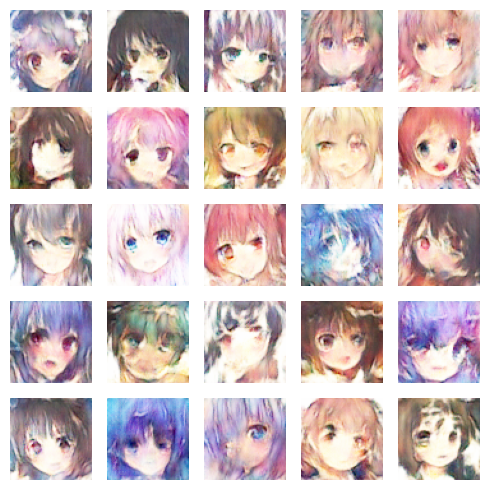

epoch:61        DiscriminatorLoss:-2.47        GeneratorLoss:0.81
epoch:62        DiscriminatorLoss:-2.46        GeneratorLoss:0.72
epoch:63        DiscriminatorLoss:-2.45        GeneratorLoss:0.84
epoch:64        DiscriminatorLoss:-2.43        GeneratorLoss:0.78
epoch:65        DiscriminatorLoss:-2.43        GeneratorLoss:0.56
epoch:66        DiscriminatorLoss:-2.41        GeneratorLoss:0.62
epoch:67        DiscriminatorLoss:-2.40        GeneratorLoss:0.56
epoch:68        DiscriminatorLoss:-2.39        GeneratorLoss:0.69
epoch:69        DiscriminatorLoss:-2.36        GeneratorLoss:0.50
epoch:70        DiscriminatorLoss:-2.37        GeneratorLoss:0.67


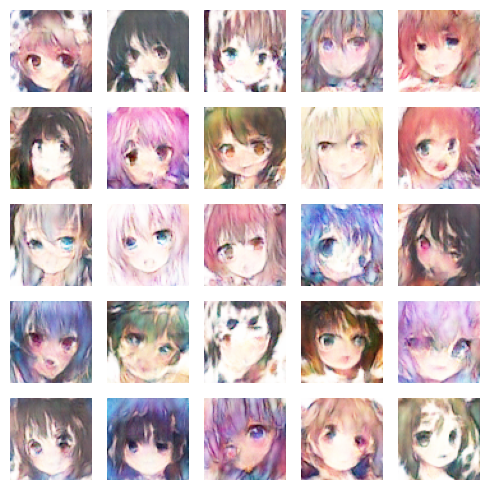

epoch:71        DiscriminatorLoss:-2.35        GeneratorLoss:0.59
epoch:72        DiscriminatorLoss:-2.35        GeneratorLoss:0.47
epoch:73        DiscriminatorLoss:-2.34        GeneratorLoss:0.57
epoch:74        DiscriminatorLoss:-2.33        GeneratorLoss:0.52
epoch:75        DiscriminatorLoss:-2.32        GeneratorLoss:0.47
epoch:76        DiscriminatorLoss:-2.30        GeneratorLoss:0.48
epoch:77        DiscriminatorLoss:-2.28        GeneratorLoss:0.44
epoch:78        DiscriminatorLoss:-2.28        GeneratorLoss:0.47
epoch:79        DiscriminatorLoss:-2.28        GeneratorLoss:0.36
epoch:80        DiscriminatorLoss:-2.26        GeneratorLoss:0.43


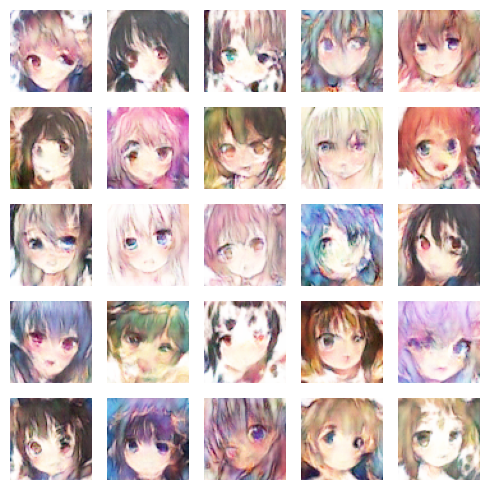

epoch:81        DiscriminatorLoss:-2.26        GeneratorLoss:0.31
epoch:82        DiscriminatorLoss:-2.24        GeneratorLoss:0.45
epoch:83        DiscriminatorLoss:-2.24        GeneratorLoss:0.34
epoch:84        DiscriminatorLoss:-2.22        GeneratorLoss:0.30
epoch:85        DiscriminatorLoss:-2.21        GeneratorLoss:0.35
epoch:86        DiscriminatorLoss:-2.20        GeneratorLoss:0.33
epoch:87        DiscriminatorLoss:-2.19        GeneratorLoss:0.28
epoch:88        DiscriminatorLoss:-2.18        GeneratorLoss:0.24
epoch:89        DiscriminatorLoss:-2.17        GeneratorLoss:0.27
epoch:90        DiscriminatorLoss:-2.16        GeneratorLoss:0.23


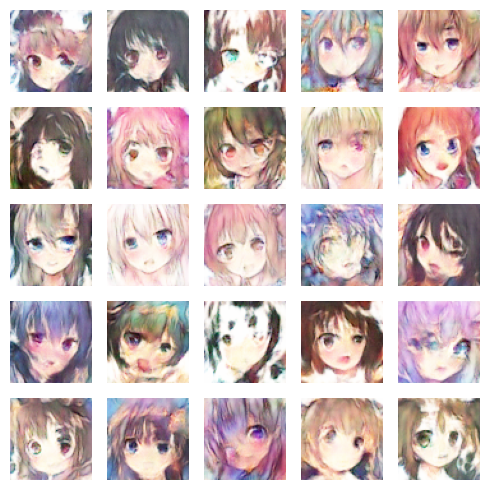

epoch:91        DiscriminatorLoss:-2.15        GeneratorLoss:0.20
epoch:92        DiscriminatorLoss:-2.15        GeneratorLoss:0.22
epoch:93        DiscriminatorLoss:-2.14        GeneratorLoss:0.28
epoch:94        DiscriminatorLoss:-2.12        GeneratorLoss:0.18
epoch:95        DiscriminatorLoss:-2.12        GeneratorLoss:0.21
epoch:96        DiscriminatorLoss:-2.11        GeneratorLoss:0.13
epoch:97        DiscriminatorLoss:-2.10        GeneratorLoss:0.18
epoch:98        DiscriminatorLoss:-2.10        GeneratorLoss:0.10
epoch:99        DiscriminatorLoss:-2.09        GeneratorLoss:0.13
epoch:100        DiscriminatorLoss:-2.08        GeneratorLoss:0.11


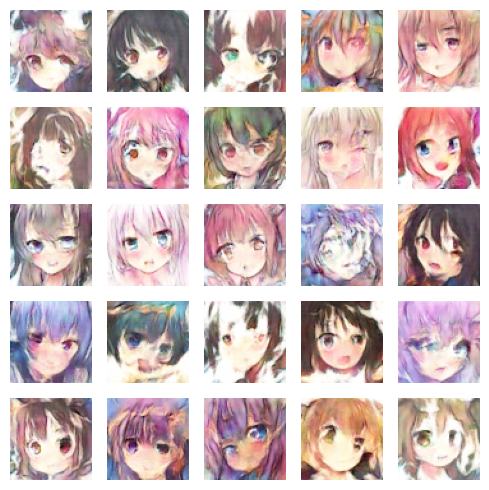

epoch:101        DiscriminatorLoss:-2.07        GeneratorLoss:0.14
epoch:102        DiscriminatorLoss:-2.06        GeneratorLoss:0.20
epoch:103        DiscriminatorLoss:-2.06        GeneratorLoss:0.01
epoch:104        DiscriminatorLoss:-2.05        GeneratorLoss:0.12
epoch:105        DiscriminatorLoss:-2.04        GeneratorLoss:0.07
epoch:106        DiscriminatorLoss:-2.04        GeneratorLoss:0.07
epoch:107        DiscriminatorLoss:-2.03        GeneratorLoss:0.06
epoch:108        DiscriminatorLoss:-2.02        GeneratorLoss:0.07
epoch:109        DiscriminatorLoss:-2.02        GeneratorLoss:0.07
epoch:110        DiscriminatorLoss:-2.01        GeneratorLoss:0.11


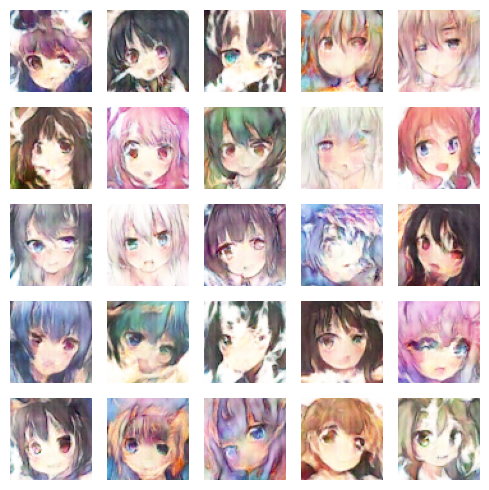

epoch:111        DiscriminatorLoss:-2.01        GeneratorLoss:0.01
epoch:112        DiscriminatorLoss:-2.00        GeneratorLoss:0.04
epoch:113        DiscriminatorLoss:-1.99        GeneratorLoss:0.00
epoch:114        DiscriminatorLoss:-2.00        GeneratorLoss:-0.08
epoch:115        DiscriminatorLoss:-1.98        GeneratorLoss:0.07
epoch:116        DiscriminatorLoss:-1.97        GeneratorLoss:-0.08
epoch:117        DiscriminatorLoss:-1.99        GeneratorLoss:0.02
epoch:118        DiscriminatorLoss:-1.97        GeneratorLoss:0.06
epoch:119        DiscriminatorLoss:-1.97        GeneratorLoss:-0.07
epoch:120        DiscriminatorLoss:-1.96        GeneratorLoss:-0.01


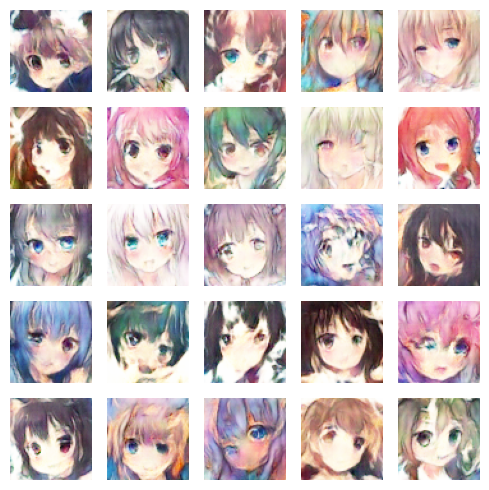

epoch:121        DiscriminatorLoss:-1.96        GeneratorLoss:-0.03
epoch:122        DiscriminatorLoss:-1.96        GeneratorLoss:-0.02
epoch:123        DiscriminatorLoss:-1.94        GeneratorLoss:-0.04
epoch:124        DiscriminatorLoss:-1.94        GeneratorLoss:-0.13
epoch:125        DiscriminatorLoss:-1.94        GeneratorLoss:0.04
epoch:126        DiscriminatorLoss:-1.93        GeneratorLoss:-0.09
epoch:127        DiscriminatorLoss:-1.92        GeneratorLoss:-0.08
epoch:128        DiscriminatorLoss:-1.93        GeneratorLoss:0.00
epoch:129        DiscriminatorLoss:-1.92        GeneratorLoss:0.01
epoch:130        DiscriminatorLoss:-1.92        GeneratorLoss:-0.06


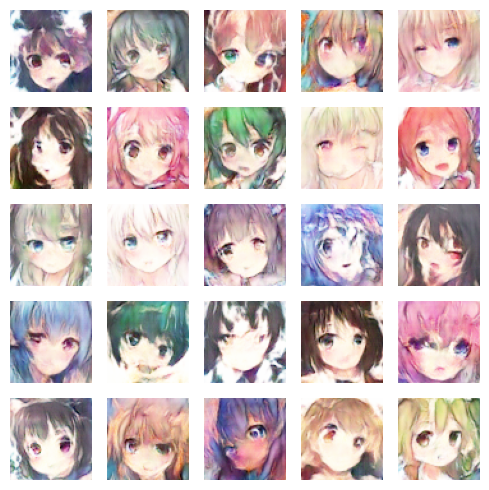

epoch:131        DiscriminatorLoss:-1.91        GeneratorLoss:-0.02
epoch:132        DiscriminatorLoss:-1.91        GeneratorLoss:-0.12
epoch:133        DiscriminatorLoss:-1.91        GeneratorLoss:-0.10
epoch:134        DiscriminatorLoss:-1.89        GeneratorLoss:-0.12
epoch:135        DiscriminatorLoss:-1.89        GeneratorLoss:-0.14
epoch:136        DiscriminatorLoss:-1.89        GeneratorLoss:-0.06
epoch:137        DiscriminatorLoss:-1.89        GeneratorLoss:0.08
epoch:138        DiscriminatorLoss:-1.88        GeneratorLoss:-0.05
epoch:139        DiscriminatorLoss:-1.87        GeneratorLoss:-0.14
epoch:140        DiscriminatorLoss:-1.87        GeneratorLoss:-0.11


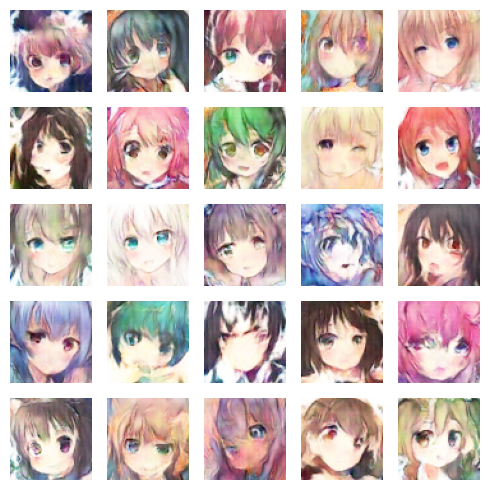

epoch:141        DiscriminatorLoss:-1.87        GeneratorLoss:-0.06
epoch:142        DiscriminatorLoss:-1.86        GeneratorLoss:-0.00
epoch:143        DiscriminatorLoss:-1.85        GeneratorLoss:-0.24
epoch:144        DiscriminatorLoss:-1.85        GeneratorLoss:-0.14
epoch:145        DiscriminatorLoss:-1.85        GeneratorLoss:-0.08
epoch:146        DiscriminatorLoss:-1.84        GeneratorLoss:-0.07
epoch:147        DiscriminatorLoss:-1.85        GeneratorLoss:-0.07
epoch:148        DiscriminatorLoss:-1.84        GeneratorLoss:-0.14
epoch:149        DiscriminatorLoss:-1.83        GeneratorLoss:-0.16
epoch:150        DiscriminatorLoss:-1.83        GeneratorLoss:-0.17


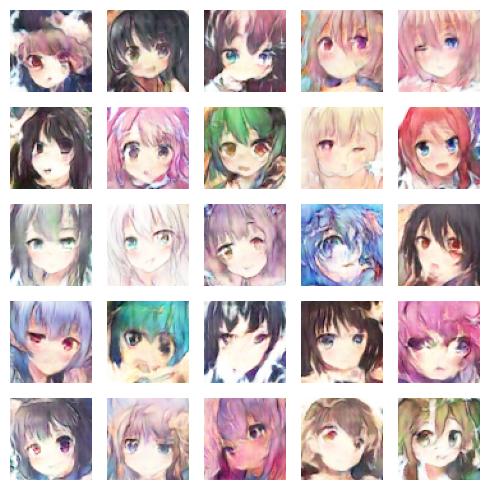

epoch:151        DiscriminatorLoss:-1.84        GeneratorLoss:-0.06
epoch:152        DiscriminatorLoss:-1.82        GeneratorLoss:-0.25
epoch:153        DiscriminatorLoss:-1.82        GeneratorLoss:-0.19
epoch:154        DiscriminatorLoss:-1.83        GeneratorLoss:-0.02
epoch:155        DiscriminatorLoss:-1.82        GeneratorLoss:-0.16
epoch:156        DiscriminatorLoss:-1.81        GeneratorLoss:-0.26
epoch:157        DiscriminatorLoss:-1.80        GeneratorLoss:-0.05
epoch:158        DiscriminatorLoss:-1.80        GeneratorLoss:-0.20
epoch:159        DiscriminatorLoss:-1.80        GeneratorLoss:-0.22
epoch:160        DiscriminatorLoss:-1.79        GeneratorLoss:-0.19


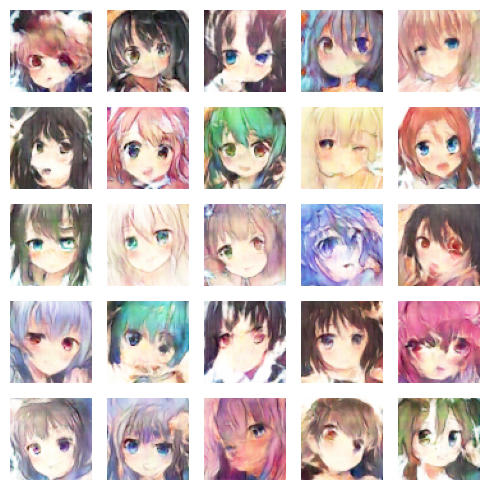

epoch:161        DiscriminatorLoss:-1.79        GeneratorLoss:-0.12
epoch:162        DiscriminatorLoss:-1.79        GeneratorLoss:-0.20
epoch:163        DiscriminatorLoss:-1.79        GeneratorLoss:-0.13
epoch:164        DiscriminatorLoss:-1.79        GeneratorLoss:-0.07
epoch:165        DiscriminatorLoss:-1.79        GeneratorLoss:-0.26
epoch:166        DiscriminatorLoss:-1.78        GeneratorLoss:-0.11
epoch:167        DiscriminatorLoss:-1.79        GeneratorLoss:-0.18
epoch:168        DiscriminatorLoss:-1.76        GeneratorLoss:-0.10
epoch:169        DiscriminatorLoss:-1.76        GeneratorLoss:-0.19
epoch:170        DiscriminatorLoss:-1.76        GeneratorLoss:-0.13


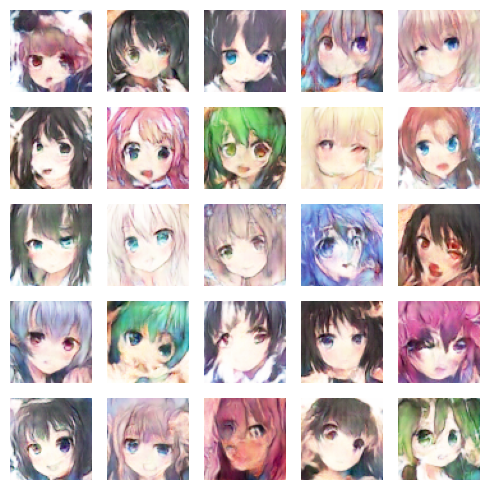

epoch:171        DiscriminatorLoss:-1.76        GeneratorLoss:-0.19
epoch:172        DiscriminatorLoss:-1.76        GeneratorLoss:-0.24
epoch:173        DiscriminatorLoss:-1.76        GeneratorLoss:-0.19
epoch:174        DiscriminatorLoss:-1.75        GeneratorLoss:-0.23
epoch:175        DiscriminatorLoss:-1.75        GeneratorLoss:-0.25
epoch:176        DiscriminatorLoss:-1.75        GeneratorLoss:-0.20
epoch:177        DiscriminatorLoss:-1.75        GeneratorLoss:-0.14
epoch:178        DiscriminatorLoss:-1.74        GeneratorLoss:-0.14
epoch:179        DiscriminatorLoss:-1.75        GeneratorLoss:-0.20
epoch:180        DiscriminatorLoss:-1.74        GeneratorLoss:-0.15


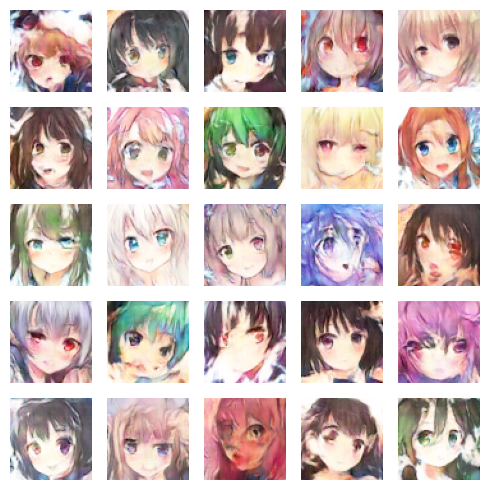

epoch:181        DiscriminatorLoss:-1.74        GeneratorLoss:-0.17
epoch:182        DiscriminatorLoss:-1.73        GeneratorLoss:-0.29
epoch:183        DiscriminatorLoss:-1.73        GeneratorLoss:-0.22
epoch:184        DiscriminatorLoss:-1.72        GeneratorLoss:-0.15
epoch:185        DiscriminatorLoss:-1.73        GeneratorLoss:-0.26
epoch:186        DiscriminatorLoss:-1.73        GeneratorLoss:-0.21
epoch:187        DiscriminatorLoss:-1.71        GeneratorLoss:-0.25
epoch:188        DiscriminatorLoss:-1.72        GeneratorLoss:-0.15
epoch:189        DiscriminatorLoss:-1.72        GeneratorLoss:-0.22
epoch:190        DiscriminatorLoss:-1.71        GeneratorLoss:-0.21


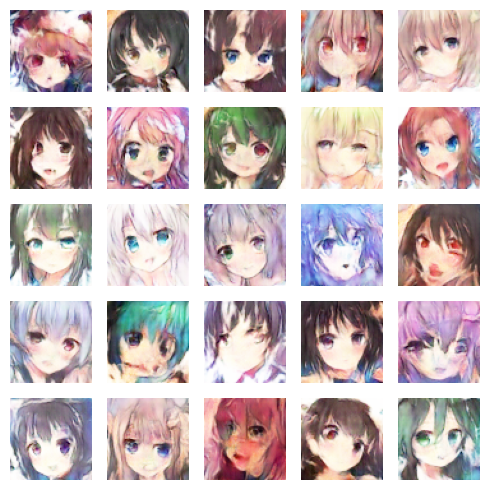

epoch:191        DiscriminatorLoss:-1.71        GeneratorLoss:-0.31
epoch:192        DiscriminatorLoss:-1.71        GeneratorLoss:-0.17
epoch:193        DiscriminatorLoss:-1.71        GeneratorLoss:-0.10
epoch:194        DiscriminatorLoss:-1.70        GeneratorLoss:-0.21
epoch:195        DiscriminatorLoss:-1.70        GeneratorLoss:-0.15
epoch:196        DiscriminatorLoss:-1.69        GeneratorLoss:-0.28
epoch:197        DiscriminatorLoss:-1.69        GeneratorLoss:-0.18
epoch:198        DiscriminatorLoss:-1.69        GeneratorLoss:-0.29
epoch:199        DiscriminatorLoss:-1.69        GeneratorLoss:-0.29


In [14]:
current_learning_rate = LR

for epoch in range(200):
#     current_learning_rate = lr_decay(current_learning_rate)    
    dLossSum = 0
    gLossSum = 0
    dcnt = 0
    gcnt = 0
    for batch in dataset:

        dLoss = trainDStep(batch)
        dLossSum += dLoss['discriminator_loss']
        dcnt += 1
        
        if dcnt % 3 == 0: 
            gLoss = trainGStep(batch)
            gLossSum += gLoss['generator_loss']
            gcnt += 1
        
    print(f'epoch:{epoch}        DiscriminatorLoss:{dLossSum/dcnt :.2f}        GeneratorLoss:{gLossSum/gcnt :.2f}')
    
    if epoch % 10 == 0:
        plot_result(model=generator, is_sample=1)

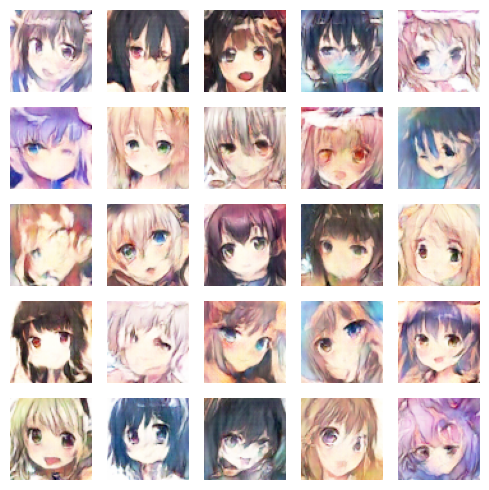

In [15]:
plot_result(model=generator, is_sample=0)